In [1]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
!wget -O datasets/tutorial3.csv "https://docs.google.com/spreadsheets/d/1lS9HEz8FreAkCpR_w_ykAHy3oWeQBqiuc_RJyr3dfbE/export?format=csv&gid=1322780754"

--2024-09-01 15:23:53--  https://docs.google.com/spreadsheets/d/1lS9HEz8FreAkCpR_w_ykAHy3oWeQBqiuc_RJyr3dfbE/export?format=csv&gid=1322780754
Resolving docs.google.com (docs.google.com)... 172.217.166.110, 2404:6800:4007:811::200e
Connecting to docs.google.com (docs.google.com)|172.217.166.110|:443... connected.
HTTP request sent, awaiting response... 307 Temporary Redirect
Location: https://doc-08-1k-sheets.googleusercontent.com/export/54bogvaave6cua4cdnls17ksc4/2l55m1th03rlfiq1n9fuopoo9c/1725184435000/100752720053680324863/*/1lS9HEz8FreAkCpR_w_ykAHy3oWeQBqiuc_RJyr3dfbE?format=csv&gid=1322780754 [following]
--2024-09-01 15:23:55--  https://doc-08-1k-sheets.googleusercontent.com/export/54bogvaave6cua4cdnls17ksc4/2l55m1th03rlfiq1n9fuopoo9c/1725184435000/100752720053680324863/*/1lS9HEz8FreAkCpR_w_ykAHy3oWeQBqiuc_RJyr3dfbE?format=csv&gid=1322780754
Resolving doc-08-1k-sheets.googleusercontent.com (doc-08-1k-sheets.googleusercontent.com)... 142.250.193.97, 2404:6800:4007:81f::2001
Connecti

In [3]:
file_path = 'datasets/tutorial3.csv'
df = pd.read_csv(file_path)

/tmp/ipykernel_5197/2996358758.py:2: DtypeWarning: Columns (9,14,21) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


In [4]:
df

,Museum ID,Museum Name,Legal Name,Alternate Name,Museum Type,Institution Name,Street Address (Administrative Location),City (Administrative Location),State (Administrative Location),Zip Code (Administrative Location),...,Latitude,Longitude,Locale Code (NCES),County Code (FIPS),State Code (FIPS),Region Code (AAM),Employer ID Number,Tax Period,Income,Revenue
0,8400200098,ALASKA AVIATION HERITAGE MUSEUM,ALASKA AVIATION HERITAGE MUSEUM,NaN,HISTORY MUSEUM,NaN,4721 AIRCRAFT DR,ANCHORAGE,AK,99502,...,61.17925,-149.97254,1.0,20.0,2.0,6,920071852,201312.0,602912.0,550236.0
1,8400200117,ALASKA BOTANICAL GARDEN,ALASKA BOTANICAL GARDEN INC,NaN,"ARBORETUM, BOTANICAL GARDEN, OR NATURE CENTER",NaN,4601 CAMPBELL AIRSTRIP RD,ANCHORAGE,AK,99507,...,61.16890,-149.76708,4.0,20.0,2.0,6,920115504,201312.0,1379576.0,1323742.0
2,8400200153,ALASKA CHALLENGER CENTER FOR SPACE SCIENCE TEC...,ALASKA CHALLENGER CENTER FOR SPACE SCIENCE TEC...,NaN,SCIENCE & TECHNOLOGY MUSEUM OR PLANETARIUM,NaN,9711 KENAI SPUR HWY,KENAI,AK,99611,...,60.56149,-151.21598,3.0,122.0,2.0,6,921761906,201312.0,740030.0,729080.0
3,8400200143,ALASKA EDUCATORS HISTORICAL SOCIETY,ALASKA EDUCATORS HISTORICAL SOCIETY,NaN,HISTORIC PRESERVATION,NaN,214 BIRCH STREET,KENAI,AK,99611,...,60.56280,-151.26597,3.0,122.0,2.0,6,920165178,201412.0,0.0,0.0
4,8400200027,ALASKA HERITAGE MUSEUM,ALASKA AVIATION HERITAGE MUSEUM,NaN,HISTORY MUSEUM,NaN,301 W NORTHERN LIGHTS BLVD,ANCHORAGE,AK,99503,...,61.17925,-149.97254,1.0,20.0,2.0,6,920071852,201312.0,602912.0,550236.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33067,8405600184,WYOMING STATE HISTORICAL SOCIETY,WYOMING STATE HISTORICAL SOCIETY,NaN,HISTORIC PRESERVATION,NaN,PO BOX 73,SHERIDAN,WY,82801,...,44.82345,-106.87592,4.0,33.0,56.0,5,836007540.0,NaN,NaN,NaN
33068,8405600061,WYOMING STATE MUSEUM,WYOMING STATE MUSEUM VOLUNTEERS INC,NaN,GENERAL MUSEUM,NaN,2301 CENTRAL AVENUE,CHEYENNE,WY,82001,...,41.13941,-104.81813,1.0,21.0,56.0,5,237368629.0,201404.0,0.0,0.0
33069,8405600158,WYOMING TERRITORIAL PARK HISTORIC ASSOCIATION,WYOMING TERRITORIAL PARK HISTORIC ASSOCIATION INC,NaN,HISTORIC PRESERVATION,NaN,1273 N 15TH ST STE 121,LARAMIE,WY,82072,...,41.32276,-105.57686,3.0,1.0,56.0,5,830318392.0,201312.0,208508.0,83981.0
33070,8405600137,WYOMING TRANSPORTATION MUSEUM,WYOMING TRANSPORTATION MUSEUM CORP,NaN,HISTORY MUSEUM,NaN,PO BOX 704,CHEYENNE,WY,82003,...,41.13010,-104.81916,1.0,21.0,56.0,5,830295570.0,201309.0,0.0,0.0


# EDA

Code up the following concepts with regards to EDA.

*   Correlation
*   Mean, median, mode
In addition, write down inferences from the dataset.

/tmp/ipykernel_5197/3846525542.py:4: DtypeWarning: Columns (9,14,21) have mixed types. Specify dtype option on import or set low_memory=False.
  self.df = pd.read_csv(file_path)


Correlation Matrix:
Museum ID: {'Museum ID': 0.9999697629414597, 'Zip Code (Physical Location)': -0.06417919233671766, 'Latitude': 0.06657878515229856, 'Longitude': 0.1117796541569837, 'Locale Code (NCES)': 0.04474629065810249, 'County Code (FIPS)': 0.11080135596971448, 'State Code (FIPS)': 0.4764716769322489, 'Region Code (AAM)': -0.06110482631351268, 'Tax Period': -0.04015461004905117, 'Income': 0.0966617747396954, 'Revenue': 0.18131130914541585}
Zip Code (Physical Location): {'Museum ID': -0.06417919233671766, 'Zip Code (Physical Location)': 0.9998915518924176, 'Latitude': -0.13256358985270242, 'Longitude': -0.9197915528374531, 'Locale Code (NCES)': -0.01877266887634681, 'County Code (FIPS)': 0.08947910499601379, 'State Code (FIPS)': -0.132021912979116, 'Region Code (AAM)': 0.9625550814315949, 'Tax Period': -0.031797613252443964, 'Income': -0.0006113932870814697, 'Revenue': -0.0009215208937806493}
Latitude: {'Museum ID': 0.06657878515229856, 'Zip Code (Physical Location)': -0.132563

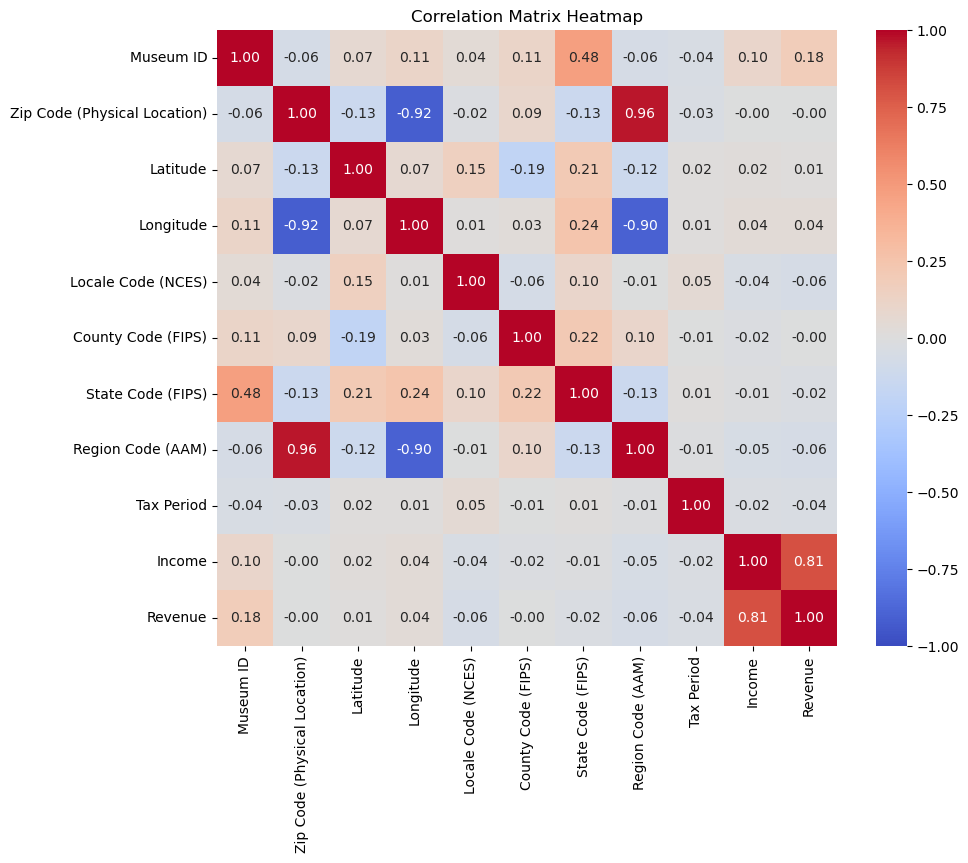

In [5]:
# Correlation
class DataFrame:
    def __init__(self, file_path):
        self.df = pd.read_csv(file_path)

    def calculate_correlation_matrix(self):
        # Get numerical columns
        df = self.df
        numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
        num_cols = len(numerical_columns)

        # Create an empty correlation matrix
        corr_matrix = {}
        for row in numerical_columns:
            corr_matrix[row] = {}
            for col in numerical_columns:
                corr_matrix[row][col] = 0

        for i in range(num_cols):
            for j in range(i, num_cols):
                col1 = numerical_columns[i]
                col2 = numerical_columns[j]

                # Calculate mean
                mean1 = df[col1].mean()
                mean2 = df[col2].mean()

                # Calculate covariance
                covariance = ((df[col1] - mean1) * (df[col2] - mean2)).mean()

                # Calculate standard deviations
                std_dev1 = df[col1].std()
                std_dev2 = df[col2].std()

                # Calculate correlation
                correlation = covariance / (std_dev1 * std_dev2)

                # Store in matrix
                corr_matrix[col1][col2] = correlation
                corr_matrix[col2][col1] = correlation  # Symmetric matrix

        return corr_matrix

    def display_correlation_matrix(self):
        corr_matrix = self.calculate_correlation_matrix()
        print("Correlation Matrix:")
        for col1, row in corr_matrix.items():
            print(f"{col1}: {row}")
        # print(len(corr_matrix))
        # print(len(corr_matrix[0]))
        data_frame = pd.DataFrame(corr_matrix) 
        plt.figure(figsize=(10,8))
        sns.heatmap(data_frame, annot=True, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1, center=0)
        plt.title('Correlation Matrix Heatmap')
        plt.show()


        

file_path = 'datasets/tutorial3.csv'
df = DataFrame(file_path)
df.display_correlation_matrix()

In [6]:
# Mean, median and mode
file_path = 'datasets/tutorial3.csv'
df = pd.read_csv(file_path)
numeric_df = df.select_dtypes(include=['float64', 'int64'])
# numeric_df = df.iloc[: -2]

for column in numeric_df.columns:
    # Retrieve the column data as a list
    data = numeric_df[column].dropna().tolist()  # Use dropna() to exclude NA values

    # Calculate mean
    total_sum = sum(data)
    count = len(data)
    mean = total_sum / count

    # Calculate median
    sorted_data = sorted(data)
    mid = count // 2
    if count % 2 == 0:
        median = (sorted_data[mid - 1] + sorted_data[mid]) / 2
    else:
        median = sorted_data[mid]

    # Calculate mode
    frequency = {}
    for value in data:
        if value in frequency:
            frequency[value] += 1
        else:
            frequency[value] = 1
    mode = max(frequency, key=frequency.get)

    # Print the results
    print(f"\nColumn: {column}")
    print(f"Mean: {mean}")
    print(f"Median: {median}")
    print(f"Mode: {mode}")



Column: Museum ID
Mean: 8403811638.324988
Median: 8403600303.5
Mode: 8400200098

Column: Zip Code (Physical Location)
Mean: 47805.64461555146
Median: 47448.0
Mode: 74743.0

Column: Latitude
Mean: 38.92537161177932
Median: 39.83164
Mode: 40.79792

Column: Longitude
Mean: -90.81675691732057
Median: -86.77684
Mode: -77.86267

Column: Locale Code (NCES)
Mean: 2.5058342173056523
Median: 2.0
Mode: 4.0

Column: County Code (FIPS)
Mean: 85.70192559601782
Median: 61.0
Mode: 1.0

Column: State Code (FIPS)
Mean: 29.065828066886397
Median: 29.0
Mode: 6.0

Column: Region Code (AAM)
Mean: 3.6700834542815675
Median: 4.0
Mode: 4

Column: Tax Period
Mean: 201347.45854810998
Median: 201312.0
Mode: 201312.0

Column: Income
Mean: 106968188.88071077
Median: 8781.0
Mode: 0.0

Column: Revenue
Mean: 20976047.056931358
Median: 3307.0
Mode: 0.0


/tmp/ipykernel_5197/566908817.py:3: DtypeWarning: Columns (9,14,21) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


### Inferences from the dataset

*   
*   
*   
*   


# Preprocessing
Code up the following concepts with regards to Preprocessing. Justify the reason for using them for this specific dataset

*   Filling in missing values.
*   Encoding

Any other techniques that you might need, please justify their usage and code them up.

In [27]:

# Filling in missing values
def count_na_values(df):
    na_counts = {col: 0 for col in df.columns}

    # Iterate through each row and column
    for index, row in df.iterrows():
        for col in df.columns:
            # Check for NA values
            if pd.isna(row[col]):
                na_counts[col] += 1

    print("Columns with NA values:")
    for column, count in na_counts.items():
        # if count > 0:
        print(f"{column}: {count}")
        # else: 
            # print("No columns with NA values")

# numerical_columns = df.select_dtypes(include=['float64', 'int64']) 
count_na_values(df)

df_copy = df.copy()
df_copy.drop(['Museum ID', 'Museum Name','Legal Name','Alternate Name','Institution Name','Zip Code (Physical Location)','Phone Number','Employer ID Number', 'Street Address (Physical Location)', 'City (Physical Location)', 'State (Physical Location)', 'Street Address (Administrative Location)'], axis=1, inplace=True)
# Custom function to fill missing values with the mean
pd.options.mode.chained_assignment = None  # default='warn'

def fill_missing_with_mean(data, numerical_columns):
    for column in numerical_columns:
        total_sum = 0
        count = 0
        for value in data[column]:
            if not pd.isna(value):  # Check for missing values
                total_sum += value
                count += 1
        mean_value = total_sum / count

        # Replace missing values with the calculated mean
        for i in range(len(data[column])):
            if pd.isna(data[column][i]) or data[column][i] == 0:
                data[column][i] = mean_value

numerical_columns = df_copy.select_dtypes(include=['float64', 'int64']).columns
fill_missing_with_mean(df_copy, numerical_columns)
count_na_values(df_copy)
df_copy


Columns with NA values:
Museum ID: 0
Museum Name: 0
Legal Name: 0
Alternate Name: 31145
Museum Type: 0
Institution Name: 30323
Street Address (Administrative Location): 10
City (Administrative Location): 0
State (Administrative Location): 0
Zip Code (Administrative Location): 0
Street Address (Physical Location): 23856
City (Physical Location): 23849
State (Physical Location): 23849
Zip Code (Physical Location): 23851
Phone Number: 10140
Latitude: 65
Longitude: 65
Locale Code (NCES): 77
County Code (FIPS): 2536
State Code (FIPS): 1
Region Code (AAM): 0
Employer ID Number: 5518
Tax Period: 9792
Income: 10111
Revenue: 10782


/tmp/ipykernel_5197/4228435825.py:40: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data[column][i] = mean_value
/tmp/ipykernel_5197/4228435825.py:40: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are settin

Columns with NA values:
Museum Type: 0
City (Administrative Location): 0
State (Administrative Location): 0
Zip Code (Administrative Location): 0
Latitude: 0
Longitude: 0
Locale Code (NCES): 0
County Code (FIPS): 0
State Code (FIPS): 0
Region Code (AAM): 0
Tax Period: 0
Income: 0
Revenue: 0


,Museum Type,City (Administrative Location),State (Administrative Location),Zip Code (Administrative Location),Latitude,Longitude,Locale Code (NCES),County Code (FIPS),State Code (FIPS),Region Code (AAM),Tax Period,Income,Revenue
0,HISTORY MUSEUM,ANCHORAGE,AK,99502,61.17925,-149.97254,1.0,20.0,2.0,6,201312.000000,6.029120e+05,5.502360e+05
1,"ARBORETUM, BOTANICAL GARDEN, OR NATURE CENTER",ANCHORAGE,AK,99507,61.16890,-149.76708,4.0,20.0,2.0,6,201312.000000,1.379576e+06,1.323742e+06
2,SCIENCE & TECHNOLOGY MUSEUM OR PLANETARIUM,KENAI,AK,99611,60.56149,-151.21598,3.0,122.0,2.0,6,201312.000000,7.400300e+05,7.290800e+05
3,HISTORIC PRESERVATION,KENAI,AK,99611,60.56280,-151.26597,3.0,122.0,2.0,6,201412.000000,1.069682e+08,2.097605e+07
4,HISTORY MUSEUM,ANCHORAGE,AK,99503,61.17925,-149.97254,1.0,20.0,2.0,6,201312.000000,6.029120e+05,5.502360e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...
33067,HISTORIC PRESERVATION,SHERIDAN,WY,82801,44.82345,-106.87592,4.0,33.0,56.0,5,201347.458548,1.069682e+08,2.097605e+07
33068,GENERAL MUSEUM,CHEYENNE,WY,82001,41.13941,-104.81813,1.0,21.0,56.0,5,201404.000000,1.069682e+08,2.097605e+07
33069,HISTORIC PRESERVATION,LARAMIE,WY,82072,41.32276,-105.57686,3.0,1.0,56.0,5,201312.000000,2.085080e+05,8.398100e+04
33070,HISTORY MUSEUM,CHEYENNE,WY,82003,41.13010,-104.81916,1.0,21.0,56.0,5,201309.000000,1.069682e+08,2.097605e+07


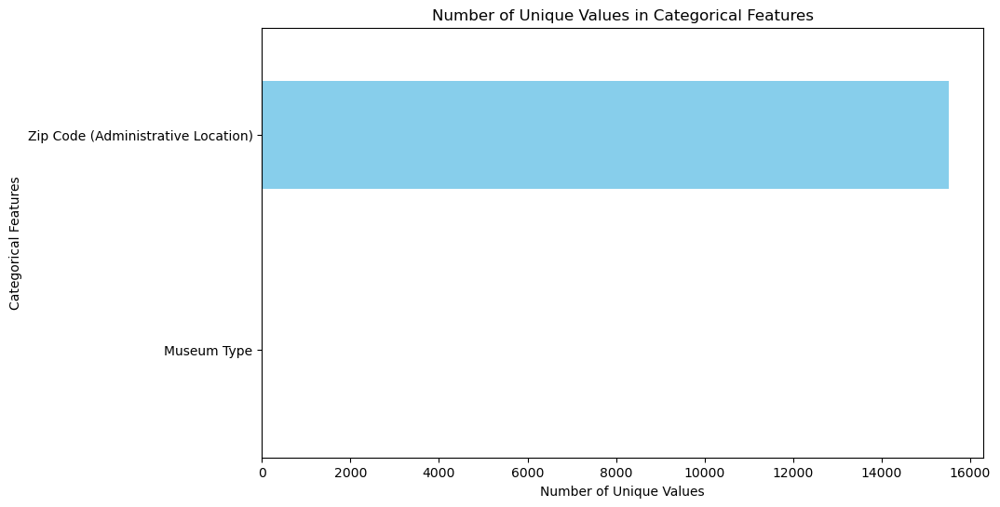

,Museum Type,Zip Code (Administrative Location),Latitude,Longitude,Locale Code (NCES),County Code (FIPS),State Code (FIPS),Region Code (AAM),Tax Period,Income,Revenue
0,HISTORY MUSEUM,99502,61.17925,-149.97254,1.0,20.0,2.0,6,201312.000000,6.029120e+05,5.502360e+05
1,"ARBORETUM, BOTANICAL GARDEN, OR NATURE CENTER",99507,61.16890,-149.76708,4.0,20.0,2.0,6,201312.000000,1.379576e+06,1.323742e+06
2,SCIENCE & TECHNOLOGY MUSEUM OR PLANETARIUM,99611,60.56149,-151.21598,3.0,122.0,2.0,6,201312.000000,7.400300e+05,7.290800e+05
3,HISTORIC PRESERVATION,99611,60.56280,-151.26597,3.0,122.0,2.0,6,201412.000000,1.069682e+08,2.097605e+07
4,HISTORY MUSEUM,99503,61.17925,-149.97254,1.0,20.0,2.0,6,201312.000000,6.029120e+05,5.502360e+05
...,...,...,...,...,...,...,...,...,...,...,...
33067,HISTORIC PRESERVATION,82801,44.82345,-106.87592,4.0,33.0,56.0,5,201347.458548,1.069682e+08,2.097605e+07
33068,GENERAL MUSEUM,82001,41.13941,-104.81813,1.0,21.0,56.0,5,201404.000000,1.069682e+08,2.097605e+07
33069,HISTORIC PRESERVATION,82072,41.32276,-105.57686,3.0,1.0,56.0,5,201312.000000,2.085080e+05,8.398100e+04
33070,HISTORY MUSEUM,82003,41.13010,-104.81916,1.0,21.0,56.0,5,201309.000000,1.069682e+08,2.097605e+07


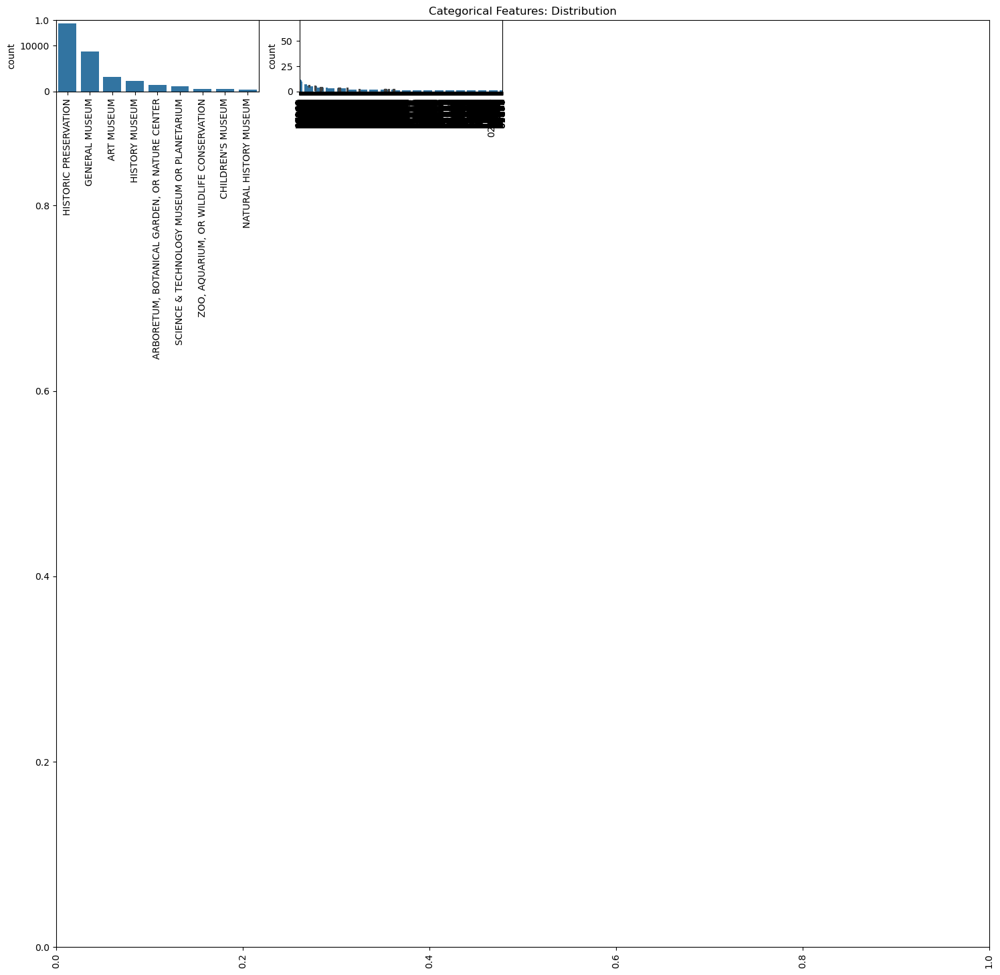

In [39]:
# Encoding
# Hint: Figure out which columns need to be encoded. Would One-Hot Encoding be enough for handling this type of data? What are the alternatives?
df_copy2 = df_copy.copy()
df_copy2.drop(['City (Administrative Location)', 'State (Administrative Location)'], axis=1, inplace=True)
categorical_columns = df_copy2.select_dtypes(include=['object', 'category']).columns

unique_counts = df_copy2[categorical_columns].nunique()

plt.figure(figsize=(10, 6))
unique_counts.sort_values().plot(kind='barh', color='skyblue')
plt.xlabel('Number of Unique Values')
plt.ylabel('Categorical Features')
plt.title('Number of Unique Values in Categorical Features')
plt.show()

plt.figure(figsize=(18, 18))
plt.title('Categorical Features: Distribution')
plt.xticks(rotation=90)
index = 1

for col in categorical_columns:
    y = df[col].value_counts()
    plt.subplot(11, 4, index)
    plt.xticks(rotation=90)
    sns.barplot(x=list(y.index), y=y)
    index += 1

df_copy2

In [28]:
count_na_values(df_copy)

Columns with NA values:
Museum Type: 0
City (Administrative Location): 0
State (Administrative Location): 0
Zip Code (Administrative Location): 0
Latitude: 0
Longitude: 0
Locale Code (NCES): 0
County Code (FIPS): 0
State Code (FIPS): 0
Region Code (AAM): 0
Tax Period: 0
Income: 0
Revenue: 0


In [42]:

def one_hot_encode(df, columns):
  """
  Args:
    df: The pandas DataFrame containing the data.
    column_name: The name of the column to one-hot encode.

  Returns:
    The DataFrame with the one-hot encoded columns.
  """
  for column_name in columns:
      unique_values = df[column_name].unique()
      for value in unique_values:
        df[column_name + "(" + str(value) + ")"] = (df[column_name] == value).astype(int)
      df = df.drop(column_name, axis=1)
  return df

df_encoded = one_hot_encode(df_copy2.copy(), ['Museum Type'])
print(df_encoded.head())

  Zip Code (Administrative Location)  Latitude  Longitude  Locale Code (NCES)  \
0                              99502  61.17925 -149.97254                 1.0   
1                              99507  61.16890 -149.76708                 4.0   
2                              99611  60.56149 -151.21598                 3.0   
3                              99611  60.56280 -151.26597                 3.0   
4                              99503  61.17925 -149.97254                 1.0   

   County Code (FIPS)  State Code (FIPS)  Region Code (AAM)  Tax Period  \
0                20.0                2.0                  6    201312.0   
1                20.0                2.0                  6    201312.0   
2               122.0                2.0                  6    201312.0   
3               122.0                2.0                  6    201412.0   
4                20.0                2.0                  6    201312.0   

         Income       Revenue  Museum Type(HISTORY MUSEUM)  \


In [43]:
df_encoded

,Zip Code (Administrative Location),Latitude,Longitude,Locale Code (NCES),County Code (FIPS),State Code (FIPS),Region Code (AAM),Tax Period,Income,Revenue,Museum Type(HISTORY MUSEUM),"Museum Type(ARBORETUM, BOTANICAL GARDEN, OR NATURE CENTER)",Museum Type(SCIENCE & TECHNOLOGY MUSEUM OR PLANETARIUM),Museum Type(HISTORIC PRESERVATION),Museum Type(GENERAL MUSEUM),"Museum Type(ZOO, AQUARIUM, OR WILDLIFE CONSERVATION)",Museum Type(ART MUSEUM),Museum Type(CHILDREN'S MUSEUM),Museum Type(NATURAL HISTORY MUSEUM)
0,99502,61.17925,-149.97254,1.0,20.0,2.0,6,201312.000000,6.029120e+05,5.502360e+05,1,0,0,0,0,0,0,0,0
1,99507,61.16890,-149.76708,4.0,20.0,2.0,6,201312.000000,1.379576e+06,1.323742e+06,0,1,0,0,0,0,0,0,0
2,99611,60.56149,-151.21598,3.0,122.0,2.0,6,201312.000000,7.400300e+05,7.290800e+05,0,0,1,0,0,0,0,0,0
3,99611,60.56280,-151.26597,3.0,122.0,2.0,6,201412.000000,1.069682e+08,2.097605e+07,0,0,0,1,0,0,0,0,0
4,99503,61.17925,-149.97254,1.0,20.0,2.0,6,201312.000000,6.029120e+05,5.502360e+05,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33067,82801,44.82345,-106.87592,4.0,33.0,56.0,5,201347.458548,1.069682e+08,2.097605e+07,0,0,0,1,0,0,0,0,0
33068,82001,41.13941,-104.81813,1.0,21.0,56.0,5,201404.000000,1.069682e+08,2.097605e+07,0,0,0,0,1,0,0,0,0
33069,82072,41.32276,-105.57686,3.0,1.0,56.0,5,201312.000000,2.085080e+05,8.398100e+04,0,0,0,1,0,0,0,0,0
33070,82003,41.13010,-104.81916,1.0,21.0,56.0,5,201309.000000,1.069682e+08,2.097605e+07,1,0,0,0,0,0,0,0,0
